<span style="color:RED;font-size: 22px;font-family: verdana;font-weight: bold ">PROJECT:Insurance Claim Fraud Detection</span>

<span style="color:RED;font-size: 22px;font-family: verdana;font-weight: bold ">BATCH NUMBER : DS2309</span>

<span style="color:RED;font-size: 22px;font-family: verdana;font-weight: bold ">NAME: ABHISHEK AGNIHOTRI</span>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import boxcox
from sklearn.preprocessing import LabelEncoder


from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix, classification_report
import warnings
warnings.filterwarnings('ignore')

<span style="color:Blue;font-size: 22px;font-family: verdana;font-weight: bold ">LOADING DATASET</span>

In [2]:
pd.set_option('display.max_rows', None)  # Display all rows
pd.set_option('display.max_columns', None)  # Display all columns

df=pd.read_csv("https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv")
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
5,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,FEMALE,PhD,tech-support,bungie-jumping,unmarried,0,0,02-01-2015,Multi-vehicle Collision,Rear Collision,Major Damage,Fire,SC,Arlington,8973 Washington St,19,3,NO,0,2,NO,64100,6410,6410,51280,Saab,95,2003,Y,NaN
6,137,34,413978,04-06-2000,IN,250/500,1000,1333.35,0,441716,MALE,PhD,prof-specialty,board-games,husband,0,-77000,13-01-2015,Multi-vehicle Collision,Front Collision,Minor Damage,Police,NY,Springfield,5846 Weaver Drive,0,3,?,0,0,?,78650,21450,7150,50050,Nissan,Pathfinder,2012,N,NaN
7,165,37,429027,03-02-1990,IL,100/300,1000,1137.03,0,603195,MALE,Associate,tech-support,base-jumping,unmarried,0,0,27-02-2015,Multi-vehicle Collision,Front Collision,Total Loss,Police,VA,Columbus,3525 3rd Hwy,23,3,?,2,2,YES,51590,9380,9380,32830,Audi,A5,2015,N,NaN
8,27,33,485665,05-02-1997,IL,100/300,500,1442.99,0,601734,FEMALE,PhD,other-service,golf,own-child,0,0,30-01-2015,Single Vehicle Collision,Front Collision,Total Loss,Police,WV,Arlington,4872 Rock Ridge,21,1,NO,1,1,YES,27700,2770,2770,22160,Toyota,Camry,2012,N,NaN
9,212,42,636550,25-07-2011,IL,100/300,500,1315.68,0,600983,MALE,PhD,priv-house-serv,camping,wife,0,-39300,05-01-2015,Single Vehicle Collision,Rear Collision,Total Loss,Other,NC,Hillsdale,3066 Francis Ave,14,1,NO,2,1,?,42300,4700,4700,32900,Saab,92x,1996,N,NaN


In [3]:
df.isin(['?']).sum()
#df.isin([' ','?','null','NA','NaN']).sum()

months_as_customer               0
age                              0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries     

In [5]:
df['number_of_vehicles_involved'].nunique()

4

In [6]:
df['incident_hour_of_the_day'].nunique()

24

In [7]:
df['incident_state'].nunique()


7

In [8]:
df['incident_city'].nunique()


7

In [9]:
df['authorities_contacted'].nunique()


5

In [10]:
df['incident_date'].nunique()


60

In [11]:
df['police_report_available'].nunique()


3

In [12]:
df['collision_type'].nunique()


4

In [13]:
df['insured_relationship'].nunique()


6

In [14]:
df['insured_hobbies'].nunique()


20

In [15]:
df['insured_occupation'].nunique()


14

In [16]:
df['insured_education_level'].nunique()

7

In [17]:

df['fraud_reported'].nunique()


2

In [18]:

df['incident_type'].nunique()


4

In [19]:
df.shape

(1000, 40)

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [21]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [22]:
df.corr()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
months_as_customer,1.000000,0.922098,0.057555,0.026807,0.005018,0.015498,0.017895,0.006399,0.020209,0.070639,0.014736,-0.010162,0.058383,0.062108,0.065329,0.034940,0.061013,-0.000292,NaN
age,0.922098,1.000000,0.059413,0.029188,0.014404,0.018126,0.025604,-0.007075,0.007368,0.087161,0.022102,-0.015679,0.052359,0.069863,0.075522,0.060898,0.062588,0.001354,NaN
policy_number,0.057555,0.059413,1.000000,-0.006738,0.022566,0.008968,0.007083,0.009802,-0.005669,0.000113,0.013432,-0.004558,-0.012661,-0.018009,-0.008762,-0.010678,-0.020184,-0.000183,NaN
policy_deductable,0.026807,0.029188,-0.006738,1.000000,-0.003245,0.010870,0.004545,0.035212,-0.023544,0.060935,0.051214,-0.022765,0.066639,0.022839,0.039107,0.064792,0.005269,0.026105,NaN
policy_annual_premium,0.005018,0.014404,0.022566,-0.003245,1.000000,-0.006247,0.032354,-0.013738,0.023547,-0.001578,-0.045991,0.026780,0.002332,0.009094,-0.017633,-0.011654,0.020246,-0.049226,NaN
umbrella_limit,0.015498,0.018126,0.008968,0.010870,-0.006247,1.000000,0.019671,-0.047268,-0.024056,-0.023257,-0.021270,0.022743,-0.006738,-0.040344,-0.045412,-0.023790,-0.038584,0.009893,NaN
insured_zip,0.017895,0.025604,0.007083,0.004545,0.032354,0.019671,1.000000,0.006303,0.049372,0.008274,0.027448,0.028695,0.019805,-0.033873,-0.017495,-0.006841,-0.041083,-0.032736,NaN
capital-gains,0.006399,-0.007075,0.009802,0.035212,-0.013738,-0.047268,0.006303,1.000000,-0.046904,-0.016406,0.061643,0.055829,-0.017651,0.015980,0.025934,-0.000779,0.015836,0.031398,NaN
capital-loss,0.020209,0.007368,-0.005669,-0.023544,0.023547,-0.024056,0.049372,-0.046904,1.000000,-0.025054,-0.014895,-0.024418,-0.041330,-0.036060,-0.046060,-0.022863,-0.032665,-0.056615,NaN
incident_hour_of_the_day,0.070639,0.087161,0.000113,0.060935,-0.001578,-0.023257,0.008274,-0.016406,-0.025054,1.000000,0.120794,-0.034563,0.006527,0.217702,0.165768,0.179536,0.215626,0.021368,NaN


In [23]:
df=df.drop('_c39', axis=1)
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
5,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,FEMALE,PhD,tech-support,bungie-jumping,unmarried,0,0,02-01-2015,Multi-vehicle Collision,Rear Collision,Major Damage,Fire,SC,Arlington,8973 Washington St,19,3,NO,0,2,NO,64100,6410,6410,51280,Saab,95,2003,Y
6,137,34,413978,04-06-2000,IN,250/500,1000,1333.35,0,441716,MALE,PhD,prof-specialty,board-games,husband,0,-77000,13-01-2015,Multi-vehicle Collision,Front Collision,Minor Damage,Police,NY,Springfield,5846 Weaver Drive,0,3,?,0,0,?,78650,21450,7150,50050,Nissan,Pathfinder,2012,N
7,165,37,429027,03-02-1990,IL,100/300,1000,1137.03,0,603195,MALE,Associate,tech-support,base-jumping,unmarried,0,0,27-02-2015,Multi-vehicle Collision,Front Collision,Total Loss,Police,VA,Columbus,3525 3rd Hwy,23,3,?,2,2,YES,51590,9380,9380,32830,Audi,A5,2015,N
8,27,33,485665,05-02-1997,IL,100/300,500,1442.99,0,601734,FEMALE,PhD,other-service,golf,own-child,0,0,30-01-2015,Single Vehicle Collision,Front Collision,Total Loss,Police,WV,Arlington,4872 Rock Ridge,21,1,NO,1,1,YES,27700,2770,2770,22160,Toyota,Camry,2012,N
9,212,42,636550,25-07-2011,IL,100/300,500,1315.68,0,600983,MALE,PhD,priv-house-serv,camping,wife,0,-39300,05-01-2015,Single Vehicle Collision,Rear Collision,Total Loss,Other,NC,Hillsdale,3066 Francis Ave,14,1,NO,2,1,?,42300,4700,4700,32900,Saab,92x,1996,N


<span style="color:bLUE;font-size: 22px;font-family: verdana;font-weight: bold ">CORRELATION BETWEEN VARIABLES </span>


In [24]:
df.corr()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
months_as_customer,1.000000,0.922098,0.057555,0.026807,0.005018,0.015498,0.017895,0.006399,0.020209,0.070639,0.014736,-0.010162,0.058383,0.062108,0.065329,0.034940,0.061013,-0.000292
age,0.922098,1.000000,0.059413,0.029188,0.014404,0.018126,0.025604,-0.007075,0.007368,0.087161,0.022102,-0.015679,0.052359,0.069863,0.075522,0.060898,0.062588,0.001354
policy_number,0.057555,0.059413,1.000000,-0.006738,0.022566,0.008968,0.007083,0.009802,-0.005669,0.000113,0.013432,-0.004558,-0.012661,-0.018009,-0.008762,-0.010678,-0.020184,-0.000183
policy_deductable,0.026807,0.029188,-0.006738,1.000000,-0.003245,0.010870,0.004545,0.035212,-0.023544,0.060935,0.051214,-0.022765,0.066639,0.022839,0.039107,0.064792,0.005269,0.026105
policy_annual_premium,0.005018,0.014404,0.022566,-0.003245,1.000000,-0.006247,0.032354,-0.013738,0.023547,-0.001578,-0.045991,0.026780,0.002332,0.009094,-0.017633,-0.011654,0.020246,-0.049226
umbrella_limit,0.015498,0.018126,0.008968,0.010870,-0.006247,1.000000,0.019671,-0.047268,-0.024056,-0.023257,-0.021270,0.022743,-0.006738,-0.040344,-0.045412,-0.023790,-0.038584,0.009893
insured_zip,0.017895,0.025604,0.007083,0.004545,0.032354,0.019671,1.000000,0.006303,0.049372,0.008274,0.027448,0.028695,0.019805,-0.033873,-0.017495,-0.006841,-0.041083,-0.032736
capital-gains,0.006399,-0.007075,0.009802,0.035212,-0.013738,-0.047268,0.006303,1.000000,-0.046904,-0.016406,0.061643,0.055829,-0.017651,0.015980,0.025934,-0.000779,0.015836,0.031398
capital-loss,0.020209,0.007368,-0.005669,-0.023544,0.023547,-0.024056,0.049372,-0.046904,1.000000,-0.025054,-0.014895,-0.024418,-0.041330,-0.036060,-0.046060,-0.022863,-0.032665,-0.056615
incident_hour_of_the_day,0.070639,0.087161,0.000113,0.060935,-0.001578,-0.023257,0.008274,-0.016406,-0.025054,1.000000,0.120794,-0.034563,0.006527,0.217702,0.165768,0.179536,0.215626,0.021368


In [25]:
df.shape

(1000, 39)

In [26]:
df.keys()

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported'],
      dtype='object')

In [27]:
df1=df.copy()

In [28]:
df1.isna().sum()


months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

<span style="color:bLUE;font-size: 22px;font-family: verdana;font-weight: bold ">IMPUTATION</span>


In [29]:
# Using mean imputation
df1=df1.fillna(df1.mean(), inplace=True)

    

In [30]:
df1=df.copy()

In [31]:
df1

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
5,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,FEMALE,PhD,tech-support,bungie-jumping,unmarried,0,0,02-01-2015,Multi-vehicle Collision,Rear Collision,Major Damage,Fire,SC,Arlington,8973 Washington St,19,3,NO,0,2,NO,64100,6410,6410,51280,Saab,95,2003,Y
6,137,34,413978,04-06-2000,IN,250/500,1000,1333.35,0,441716,MALE,PhD,prof-specialty,board-games,husband,0,-77000,13-01-2015,Multi-vehicle Collision,Front Collision,Minor Damage,Police,NY,Springfield,5846 Weaver Drive,0,3,?,0,0,?,78650,21450,7150,50050,Nissan,Pathfinder,2012,N
7,165,37,429027,03-02-1990,IL,100/300,1000,1137.03,0,603195,MALE,Associate,tech-support,base-jumping,unmarried,0,0,27-02-2015,Multi-vehicle Collision,Front Collision,Total Loss,Police,VA,Columbus,3525 3rd Hwy,23,3,?,2,2,YES,51590,9380,9380,32830,Audi,A5,2015,N
8,27,33,485665,05-02-1997,IL,100/300,500,1442.99,0,601734,FEMALE,PhD,other-service,golf,own-child,0,0,30-01-2015,Single Vehicle Collision,Front Collision,Total Loss,Police,WV,Arlington,4872 Rock Ridge,21,1,NO,1,1,YES,27700,2770,2770,22160,Toyota,Camry,2012,N
9,212,42,636550,25-07-2011,IL,100/300,500,1315.68,0,600983,MALE,PhD,priv-house-serv,camping,wife,0,-39300,05-01-2015,Single Vehicle Collision,Rear Collision,Total Loss,Other,NC,Hillsdale,3066 Francis Ave,14,1,NO,2,1,?,42300,4700,4700,32900,Saab,92x,1996,N


In [32]:
df1.isin(['?']).sum()


months_as_customer               0
age                              0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries     

In [33]:
df1.isnull().sum()


months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

In [34]:
df1.replace('?', np.nan, inplace=True)

In [35]:
df1.isnull().sum()


months_as_customer               0
age                              0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries     

In [36]:
df1.fillna(df1.mode().iloc[0], inplace=True)


<span style="color:bLUE;font-size: 22px;font-family: verdana;font-weight: bold ">CHECKING NULL VALUE </span>


In [37]:
df1.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

In [38]:
df2=df1.copy()

<span style="color:bLUE;font-size: 22px;font-family: verdana;font-weight: bold ">FEATURE SELECTION </span>


In [39]:
columns_to_drop=['auto_year', 'auto_model','auto_make','policy_number','insured_zip','insured_hobbies','incident_date','collision_type','incident_state']
df2 = df2.drop(columns=columns_to_drop)
df2.shape

(1000, 30)

In [40]:
df2.keys()

Index(['months_as_customer', 'age', 'policy_bind_date', 'policy_state',
       'policy_csl', 'policy_deductable', 'policy_annual_premium',
       'umbrella_limit', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_relationship', 'capital-gains',
       'capital-loss', 'incident_type', 'incident_severity',
       'authorities_contacted', 'incident_city', 'incident_location',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'property_damage', 'bodily_injuries', 'witnesses',
       'police_report_available', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'fraud_reported'],
      dtype='object')

<span style="color:bLUE;font-size: 22px;font-family: verdana;font-weight: bold ">IDENTIFYING CATEGORICAL DATA</span>


In [41]:
for i in df2.columns:
    if df2[i].dtypes=='O':
        print (i)
        print (f"Column name: {i} having unique numbers {df2[i].nunique()}")
    

policy_bind_date
Column name: policy_bind_date having unique numbers 951
policy_state
Column name: policy_state having unique numbers 3
policy_csl
Column name: policy_csl having unique numbers 3
insured_sex
Column name: insured_sex having unique numbers 2
insured_education_level
Column name: insured_education_level having unique numbers 7
insured_occupation
Column name: insured_occupation having unique numbers 14
insured_relationship
Column name: insured_relationship having unique numbers 6
incident_type
Column name: incident_type having unique numbers 4
incident_severity
Column name: incident_severity having unique numbers 4
authorities_contacted
Column name: authorities_contacted having unique numbers 5
incident_city
Column name: incident_city having unique numbers 7
incident_location
Column name: incident_location having unique numbers 1000
property_damage
Column name: property_damage having unique numbers 2
police_report_available
Column name: police_report_available having unique 

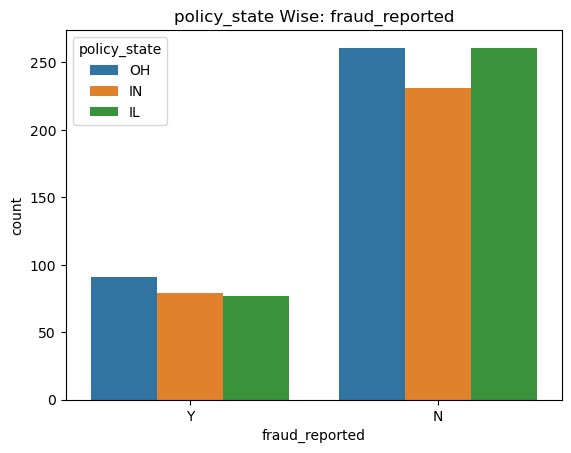

In [42]:
sns.countplot(x='fraud_reported', hue='policy_state', data=df2)
plt.title('policy_state Wise: fraud_reported')
plt.show()

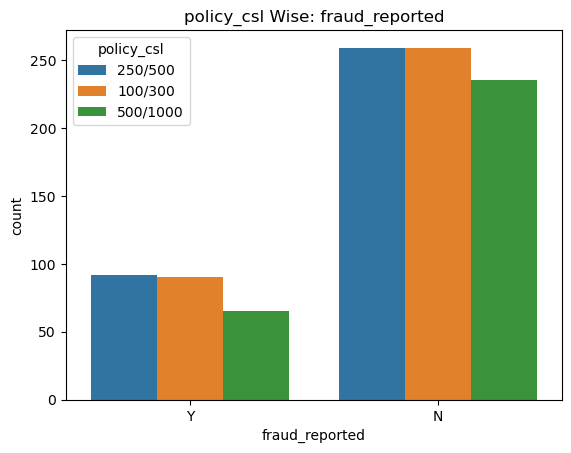

In [43]:
sns.countplot(x='fraud_reported', hue='policy_csl', data=df2)
plt.title('policy_csl Wise: fraud_reported')
plt.show()

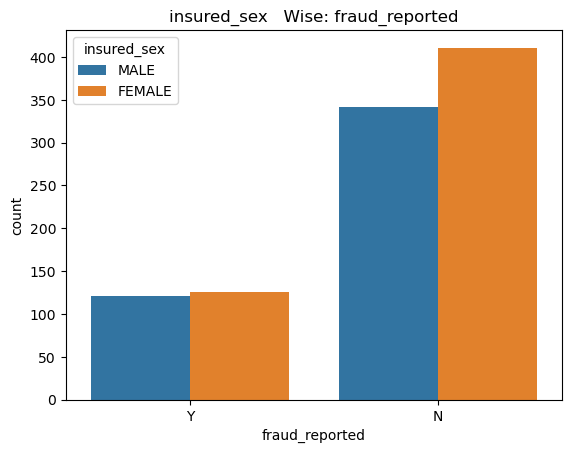

In [44]:
sns.countplot(x='fraud_reported', hue='insured_sex', data=df2)
plt.title('insured_sex   Wise: fraud_reported')
plt.show()

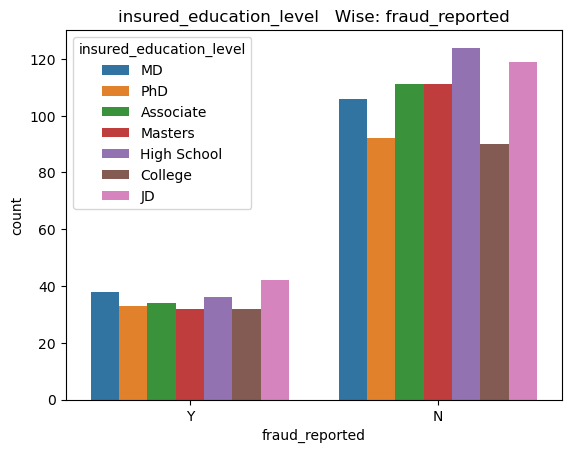

In [45]:
sns.countplot(x='fraud_reported', hue='insured_education_level', data=df2)
plt.title('insured_education_level   Wise: fraud_reported')
plt.show()

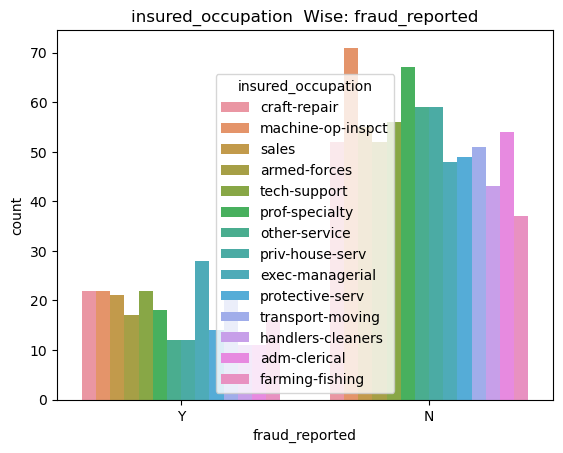

In [46]:
sns.countplot(x='fraud_reported', hue='insured_occupation', data=df2)
plt.title('insured_occupation  Wise: fraud_reported')
plt.show()

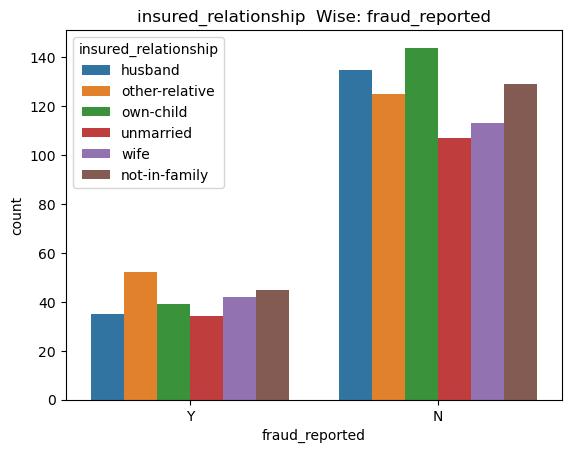

In [47]:
sns.countplot(x='fraud_reported', hue='insured_relationship', data=df2)
plt.title('insured_relationship  Wise: fraud_reported')
plt.show()

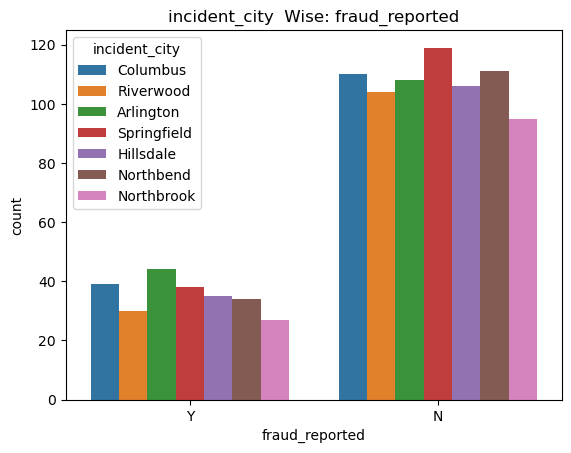

In [48]:
sns.countplot(x='fraud_reported', hue='incident_city', data=df2)
plt.title('incident_city  Wise: fraud_reported')
plt.show()

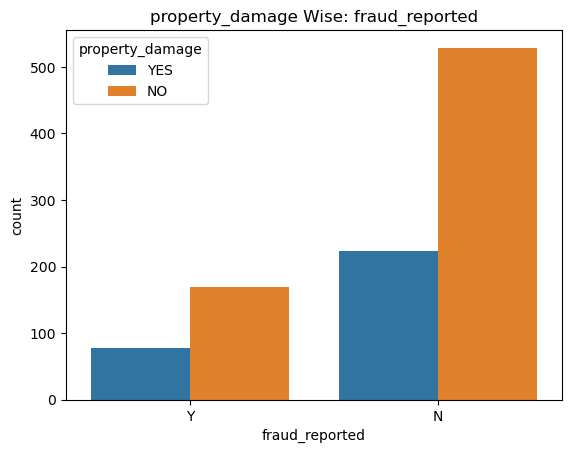

In [49]:
sns.countplot(x='fraud_reported', hue='property_damage', data=df2)
plt.title('property_damage Wise: fraud_reported')
plt.show()

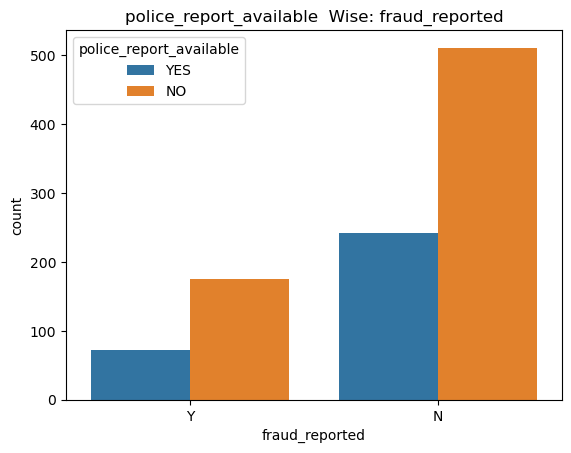

In [50]:
sns.countplot(x='fraud_reported', hue='police_report_available', data=df2)
plt.title('police_report_available  Wise: fraud_reported')
plt.show()

<span style="color:Blue;font-size: 22px;font-family: verdana;font-weight: bold ">STATS OF DATASET</span>

In [51]:
df2.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,1.101000e+06,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000
std,115.113174,9.140287,611.864673,244.167395,2.297407e+06,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893
min,0.000000,19.000000,500.000000,433.330000,-1.000000e+06,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000e+00,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000e+00,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000
75%,276.250000,44.000000,2000.000000,1415.695000,0.000000e+00,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000
max,479.000000,64.000000,2000.000000,2047.590000,1.000000e+07,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000


<span style="color:Blue;font-size: 22px;font-family: verdana;font-weight: bold ">VISULAIZATION:CORRELATION</span>

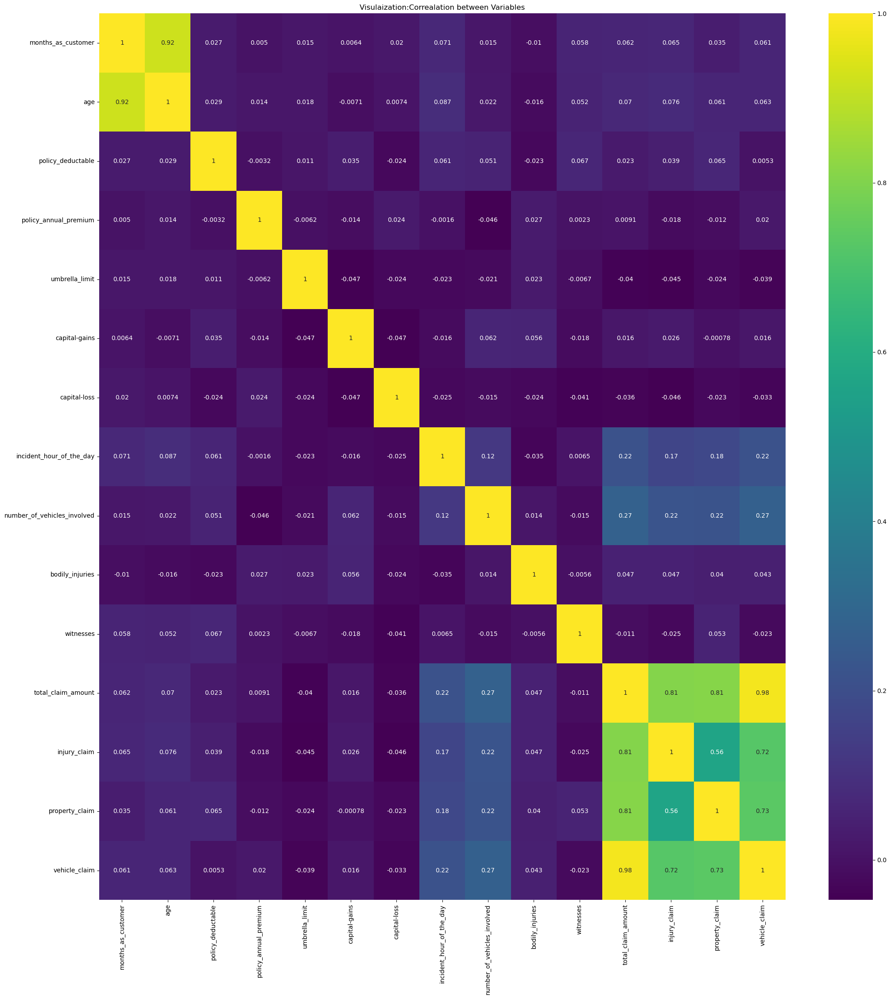

In [52]:
plt.figure(figsize=(25,26), facecolor='w')
sns.heatmap(df2.corr(), annot=True, cmap='viridis')
plt.title("Visulaization:Correalation between Variables")
plt.show()

<span style="color:bLUE;font-size: 22px;font-family: verdana;font-weight: bold ">CHECKING SKEWNESS </span>


In [53]:
df2.skew()

months_as_customer             0.362177
age                            0.478988
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
capital-gains                  0.478850
capital-loss                  -0.391472
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
bodily_injuries                0.014777
witnesses                      0.019636
total_claim_amount            -0.594582
injury_claim                   0.264811
property_claim                 0.378169
vehicle_claim                 -0.621098
dtype: float64

In [54]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 30 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_bind_date             1000 non-null   object 
 3   policy_state                 1000 non-null   object 
 4   policy_csl                   1000 non-null   object 
 5   policy_deductable            1000 non-null   int64  
 6   policy_annual_premium        1000 non-null   float64
 7   umbrella_limit               1000 non-null   int64  
 8   insured_sex                  1000 non-null   object 
 9   insured_education_level      1000 non-null   object 
 10  insured_occupation           1000 non-null   object 
 11  insured_relationship         1000 non-null   object 
 12  capital-gains                1000 non-null   int64  
 13  capital-loss       

<span style="color:bLUE;font-size: 22px;font-family: verdana;font-weight: bold ">CORRECTING SKEWNESS </span>


In [55]:
from scipy.stats import boxcox

for i in df2.columns:
    if df2[i].dtypes == 'int64':
        skewness = df2[i].skew()

        if skewness > 0.5:
            # Add a constant to make the data positive
            min_value = df2[i].min()
            if min_value <= 0:
                constant = abs(min_value) + 1
                df2[i] = df2[i] + constant

            # Apply Box-Cox transformation
            df2[i], _ = boxcox(df2[i])


In [56]:
df2.skew()

months_as_customer             0.362177
age                            0.478988
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 0.374570
capital-gains                  0.478850
capital-loss                  -0.391472
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.355582
bodily_injuries                0.014777
witnesses                      0.019636
total_claim_amount            -0.594582
injury_claim                   0.264811
property_claim                 0.378169
vehicle_claim                 -0.621098
dtype: float64

<span style="color:bLUE;font-size: 22px;font-family: verdana;font-weight: bold ">VISUALIZATION:AFTER CORRECTION OF SKEWNESS </span>

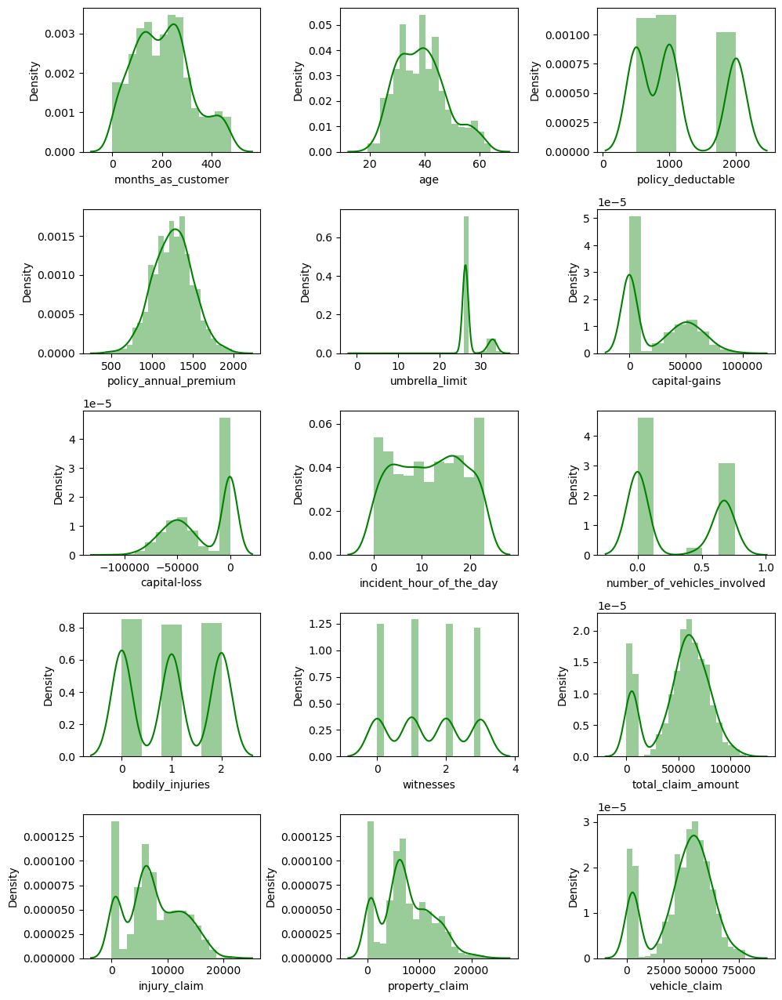

In [57]:
plt.figure(figsize=(10, 15), facecolor='w')
pltnum = 1

for i in df2.columns:
        if df2[i].dtypes in ['int64', 'float64']:  
 
            if pltnum < 18:
                plt.subplot(6, 3, pltnum)
                sns.distplot(df2[i], color='g')
                plt.xlabel(i)
                pltnum += 1

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

<span style="color:bLUE;font-size: 22px;font-family: verdana;font-weight: bold ">VISUALIZATION:OUTLIER IN DATASET-BOXPLOTS</span>

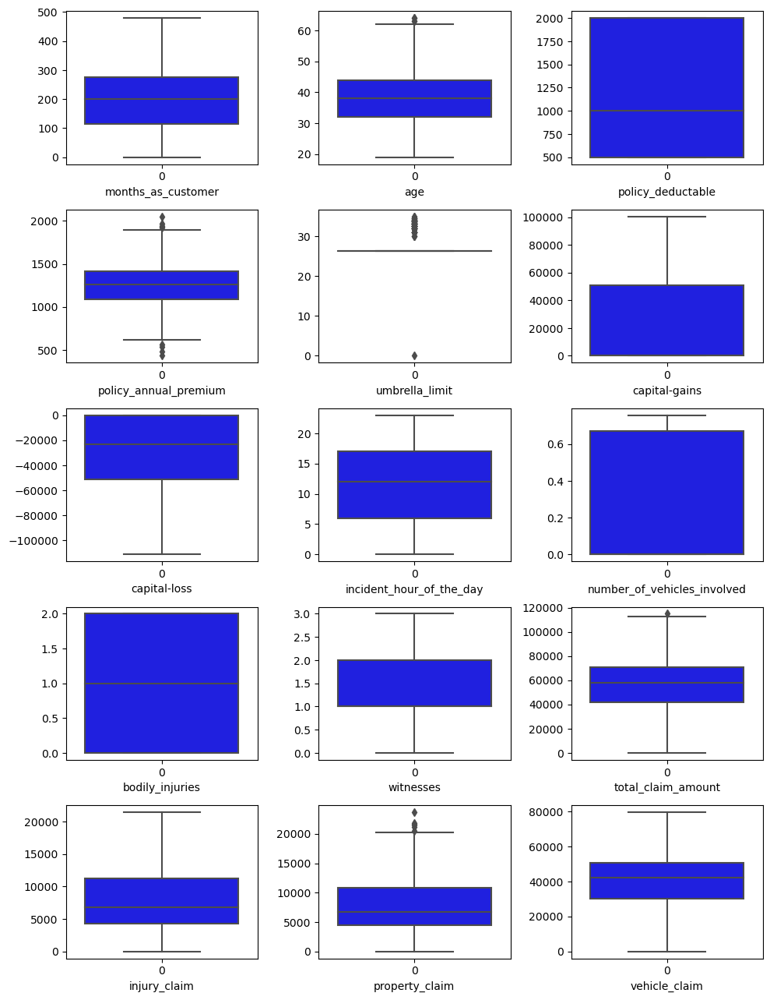

In [58]:
plt.figure(figsize=(10, 15), facecolor='w')
pltnum = 1

for i in df2.columns:
        if df2[i].dtypes in ['int64', 'float64']:  
 
            if pltnum < 18:
                plt.subplot(6, 3, pltnum)
                sns.boxplot(df2[i], color='b')
                plt.xlabel(i)
                pltnum += 1

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

In [59]:
df3=df2.copy()

In [60]:
from scipy.stats import zscore

# Iterate over columns in the DataFrame
for i in df3.columns:
    # Check if the column is of type 'int64' or 'float64'
    if df3[i].dtypes in ['int64', 'float64']:
        # Calculate z-scores for the current column
        z_score = zscore(df3[i])
        
        # Identify and filter out outliers using z-scores
        outliers = (np.abs(z_score) > 3)
        df3 = df3[~outliers]

# Display the DataFrame after removing outliers
print(df3)

     months_as_customer  age policy_bind_date policy_state policy_csl  \
0                   328   48       17-10-2014           OH    250/500   
1                   228   42       27-06-2006           IN    250/500   
2                   134   29       06-09-2000           OH    100/300   
3                   256   41       25-05-1990           IL    250/500   
4                   228   44       06-06-2014           IL   500/1000   
5                   256   39       12-10-2006           OH    250/500   
6                   137   34       04-06-2000           IN    250/500   
7                   165   37       03-02-1990           IL    100/300   
8                    27   33       05-02-1997           IL    100/300   
9                   212   42       25-07-2011           IL    100/300   
10                  235   42       26-05-2002           OH    100/300   
11                  447   61       29-05-1999           OH    100/300   
12                   60   23       20-11-1997      

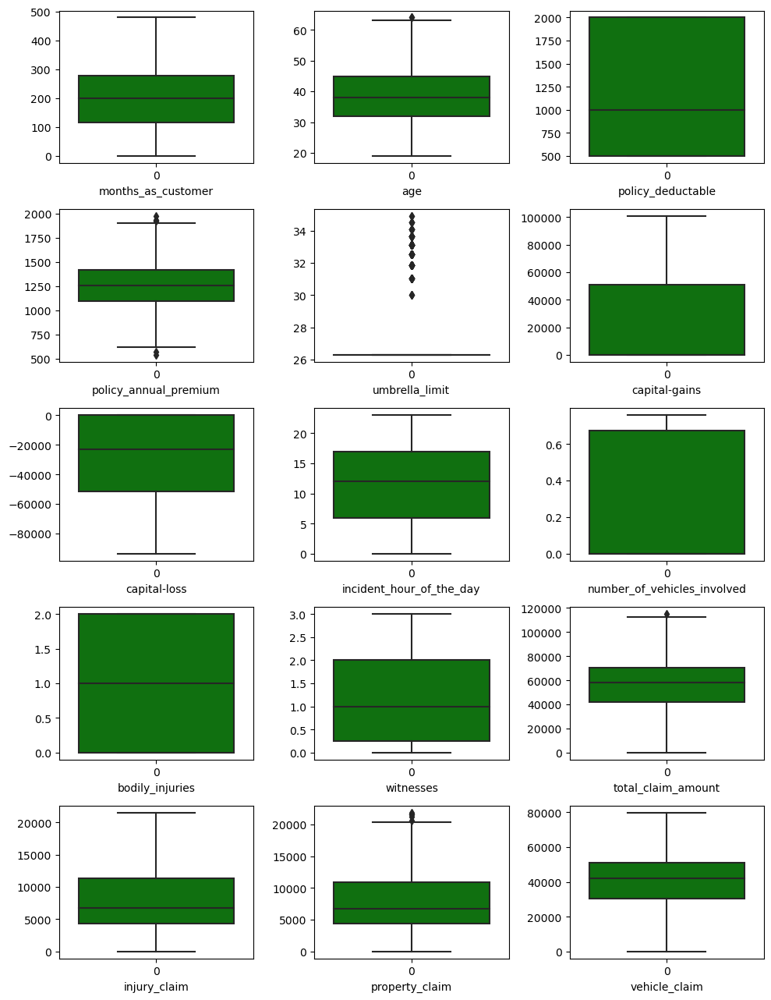

In [61]:
plt.figure(figsize=(10, 15), facecolor='w')
pltnum = 1

for i in df3.columns:
        if df3[i].dtypes in ['int64', 'float64']:  
 
            if pltnum < 18:
                plt.subplot(6, 3, pltnum)
                sns.boxplot(df3[i], color='g')
                plt.xlabel(i)
                pltnum += 1

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

<span style="color:bLUE;font-size: 22px;font-family: verdana;font-weight: bold ">IMPLEMENTATION OF LABEL ENCODING</span>

In [64]:
for i in df2.columns:
    if df2[i].dtypes=='O':
        #print (i)
        print (f"Column name: {i} having unique numbers {df2[i].nunique()}")

Column name: policy_bind_date having unique numbers 951
Column name: policy_state having unique numbers 3
Column name: policy_csl having unique numbers 3
Column name: insured_sex having unique numbers 2
Column name: insured_education_level having unique numbers 7
Column name: insured_occupation having unique numbers 14
Column name: insured_relationship having unique numbers 6
Column name: incident_type having unique numbers 4
Column name: incident_severity having unique numbers 4
Column name: authorities_contacted having unique numbers 5
Column name: incident_city having unique numbers 7
Column name: incident_location having unique numbers 1000
Column name: property_damage having unique numbers 2
Column name: police_report_available having unique numbers 2
Column name: fraud_reported having unique numbers 2


In [67]:
df2 = df2.drop('policy_bind_date', axis=1)


In [68]:
df2.shape

(1000, 29)

In [69]:
from sklearn.preprocessing import LabelEncoder

# Create an instance of LabelEncoder
le = LabelEncoder()

# Specify the columns to encode
columns_to_encode=['policy_state','policy_csl','insured_sex','insured_education_level','insured_occupation','insured_relationship','incident_type','incident_severity','authorities_contacted','incident_city','incident_location','property_damage','police_report_available','fraud_reported']
# Apply LabelEncoder to each specified column in the original DataFrame
df2[columns_to_encode] = df2[columns_to_encode].apply(lambda col: le.fit_transform(col))

# Display the modified DataFrame
df2.head(15)

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_relationship,capital-gains,capital-loss,incident_type,incident_severity,authorities_contacted,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,fraud_reported
0,328,48,2,1,1000,1406.91,26.286726,1,4,2,0,53300,0,2,0,4,1,996,5,0.000000,1,1,2,1,71610,6510,13020,52080,1
1,228,42,1,1,2000,1197.22,32.541709,1,4,6,2,0,0,3,1,4,5,628,8,0.000000,0,0,0,0,5070,780,780,3510,1
2,134,29,2,0,2000,1413.14,32.541709,0,6,11,3,35100,0,0,1,4,1,685,7,0.672352,0,2,3,0,34650,7700,3850,23100,0
3,256,41,0,1,2000,1415.74,33.125634,0,6,1,4,48900,-62400,2,0,4,0,669,5,0.000000,0,1,2,0,63400,6340,6340,50720,1
4,228,44,0,2,1000,1583.91,33.125634,1,0,11,4,66000,-46000,3,1,2,0,220,20,0.000000,0,0,1,0,6500,1300,650,4550,0
5,256,39,2,1,1000,1351.10,26.286726,0,6,12,4,0,0,0,0,1,0,891,19,0.672352,0,0,2,0,64100,6410,6410,51280,1
6,137,34,1,1,1000,1333.35,26.286726,1,6,9,0,0,-77000,0,1,4,6,539,0,0.672352,0,0,0,0,78650,21450,7150,50050,0
7,165,37,0,0,1000,1137.03,26.286726,1,0,12,4,0,0,0,2,4,1,276,23,0.672352,0,2,2,1,51590,9380,9380,32830,0
8,27,33,0,0,500,1442.99,26.286726,0,6,7,3,0,0,2,2,4,0,429,21,0.000000,0,1,1,1,27700,2770,2770,22160,0
9,212,42,0,0,500,1315.68,26.286726,1,6,8,5,0,-39300,2,2,3,2,224,14,0.000000,0,2,1,0,42300,4700,4700,32900,0


<span style="color:bLUE;font-size: 22px;font-family: verdana;font-weight: bold ">SEPRATING INPUT VARIABLE</span>

In [70]:
df3=df2.copy()

In [71]:
df3.shape

(1000, 29)

In [76]:
X=df3.drop('fraud_reported', axis=1)
X

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_relationship,capital-gains,capital-loss,incident_type,incident_severity,authorities_contacted,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim
0,328,48,2,1,1000,1406.91,26.286726,1,4,2,0,53300,0,2,0,4,1,996,5,0.000000,1,1,2,1,71610,6510,13020,52080
1,228,42,1,1,2000,1197.22,32.541709,1,4,6,2,0,0,3,1,4,5,628,8,0.000000,0,0,0,0,5070,780,780,3510
2,134,29,2,0,2000,1413.14,32.541709,0,6,11,3,35100,0,0,1,4,1,685,7,0.672352,0,2,3,0,34650,7700,3850,23100
3,256,41,0,1,2000,1415.74,33.125634,0,6,1,4,48900,-62400,2,0,4,0,669,5,0.000000,0,1,2,0,63400,6340,6340,50720
4,228,44,0,2,1000,1583.91,33.125634,1,0,11,4,66000,-46000,3,1,2,0,220,20,0.000000,0,0,1,0,6500,1300,650,4550
5,256,39,2,1,1000,1351.10,26.286726,0,6,12,4,0,0,0,0,1,0,891,19,0.672352,0,0,2,0,64100,6410,6410,51280
6,137,34,1,1,1000,1333.35,26.286726,1,6,9,0,0,-77000,0,1,4,6,539,0,0.672352,0,0,0,0,78650,21450,7150,50050
7,165,37,0,0,1000,1137.03,26.286726,1,0,12,4,0,0,0,2,4,1,276,23,0.672352,0,2,2,1,51590,9380,9380,32830
8,27,33,0,0,500,1442.99,26.286726,0,6,7,3,0,0,2,2,4,0,429,21,0.000000,0,1,1,1,27700,2770,2770,22160
9,212,42,0,0,500,1315.68,26.286726,1,6,8,5,0,-39300,2,2,3,2,224,14,0.000000,0,2,1,0,42300,4700,4700,32900


In [74]:
Y=df3['fraud_reported']

In [77]:
X.shape

(1000, 28)

In [78]:
Y.shape

(1000,)

<span style="color:bLUE;font-size: 22px;font-family: verdana;font-weight: bold ">Scaling of Data: MINMAX SCALER</span>

In [79]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X= scaler.fit_transform(X)
X

array([[ 1.07813958,  0.99083647,  1.18717314, ..., -0.18928317,
         1.16550497,  0.74965272],
       [ 0.2089946 ,  0.33407345, -0.01685641, ..., -1.36382194,
        -1.37269599, -1.82334593],
       [-0.60800168, -1.08891308,  1.18717314, ...,  0.05464372,
        -0.73607206, -0.78556451],
       ...,
       [-0.64276748, -0.54161057,  1.18717314, ...,  0.01364761,
         0.0208261 ,  0.77190224],
       [ 2.20802805,  2.52328351, -1.22088596, ..., -0.45370813,
        -0.45197603, -0.07357971],
       [ 2.19064515,  2.3043625 ,  1.18717314, ..., -1.42941572,
        -1.34366428, -1.81434017]])

<span style="color:bLUE;font-size: 22px;font-family: verdana;font-weight: bold ">SPLITTING THE DATA IN X, Y : TRAINING, TESTING</span>

In [81]:
X_train, X_test, Y_train, Y_test= train_test_split(X,Y,test_size=0.30)

<span style="color:Blue;font-size: 22px;font-family: verdana;font-weight: bold ">MODEL IMPORT</span>

In [82]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
import warnings
warnings.filterwarnings('ignore')

<span style="color:Blue;font-size: 22px;font-family: verdana;font-weight: bold ">FINDING BEST RANDOM STATE</span>

In [83]:
max_acc = 0
max_rs = 0

for i in range(1, 300):
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.30, random_state=i)
    lr = LogisticRegression()
    lr.fit(X_train, Y_train)
    pred = lr.predict(X_test)
    acc_report = accuracy_score(Y_test, pred)
    
    if acc_report > max_acc:
        max_acc = acc_report
        max_rs = i

    # Print accuracy for each random state
    print("Accuracy Score at Random State", i, "is", acc_report)

# Print the maximum accuracy and corresponding random state
print("Maximum Accuracy Score is", max_acc, "at Random State", max_rs)

Accuracy Score at Random State 1 is 0.7666666666666667
Accuracy Score at Random State 2 is 0.7866666666666666
Accuracy Score at Random State 3 is 0.7666666666666667
Accuracy Score at Random State 4 is 0.7933333333333333
Accuracy Score at Random State 5 is 0.77
Accuracy Score at Random State 6 is 0.8033333333333333
Accuracy Score at Random State 7 is 0.77
Accuracy Score at Random State 8 is 0.75
Accuracy Score at Random State 9 is 0.76
Accuracy Score at Random State 10 is 0.7833333333333333
Accuracy Score at Random State 11 is 0.75
Accuracy Score at Random State 12 is 0.7833333333333333
Accuracy Score at Random State 13 is 0.7733333333333333
Accuracy Score at Random State 14 is 0.7566666666666667
Accuracy Score at Random State 15 is 0.77
Accuracy Score at Random State 16 is 0.7966666666666666
Accuracy Score at Random State 17 is 0.7766666666666666
Accuracy Score at Random State 18 is 0.8066666666666666
Accuracy Score at Random State 19 is 0.77
Accuracy Score at Random State 20 is 0.79
A

Accuracy Score at Random State 164 is 0.79
Accuracy Score at Random State 165 is 0.8166666666666667
Accuracy Score at Random State 166 is 0.79
Accuracy Score at Random State 167 is 0.7633333333333333
Accuracy Score at Random State 168 is 0.7666666666666667
Accuracy Score at Random State 169 is 0.7766666666666666
Accuracy Score at Random State 170 is 0.7666666666666667
Accuracy Score at Random State 171 is 0.7566666666666667
Accuracy Score at Random State 172 is 0.7733333333333333
Accuracy Score at Random State 173 is 0.7966666666666666
Accuracy Score at Random State 174 is 0.7833333333333333
Accuracy Score at Random State 175 is 0.7866666666666666
Accuracy Score at Random State 176 is 0.77
Accuracy Score at Random State 177 is 0.8033333333333333
Accuracy Score at Random State 178 is 0.7666666666666667
Accuracy Score at Random State 179 is 0.7833333333333333
Accuracy Score at Random State 180 is 0.8
Accuracy Score at Random State 181 is 0.7933333333333333
Accuracy Score at Random State 

<span style="color:red;font-size: 22px;font-family: verdana;font-weight: bold ">Maximum Accuracy Score is  0.83 at Random State 280</span>

<span style="color:Blue;font-size: 22px;font-family: verdana;font-weight: bold ">LOGISTIC REGRESSION</SPAN>


In [99]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y, test_size=0.3, random_state=280)

lr=LogisticRegression()
lr.fit(X_train,Y_train)
pred=lr.predict(X_test)

print("Accuracy Score ", accuracy_score(pred,Y_test))
print("Confusion Matrix ", confusion_matrix(pred,Y_test))
print("Classfication Reports ", classification_report(pred,Y_test))

Accuracy Score  0.83
Confusion Matrix  [[214  31]
 [ 20  35]]
Classfication Reports                precision    recall  f1-score   support

           0       0.91      0.87      0.89       245
           1       0.53      0.64      0.58        55

    accuracy                           0.83       300
   macro avg       0.72      0.75      0.74       300
weighted avg       0.84      0.83      0.84       300



<span style="color:Blue;font-size: 22px;font-family: verdana;font-weight: bold ">DECESSION TREE CLASSIFIER</SPAN>

In [100]:
dtc=DecisionTreeClassifier()
dtc.fit(X_train,Y_train)
pred=dtc.predict(X_test)

print("Accuracy Score ", accuracy_score(pred,Y_test))
print("Confusion Matrix ", confusion_matrix(pred,Y_test))
print("Classfication Reports ", classification_report(pred,Y_test))

Accuracy Score  0.6766666666666666
Confusion Matrix  [[178  41]
 [ 56  25]]
Classfication Reports                precision    recall  f1-score   support

           0       0.76      0.81      0.79       219
           1       0.38      0.31      0.34        81

    accuracy                           0.68       300
   macro avg       0.57      0.56      0.56       300
weighted avg       0.66      0.68      0.67       300



<span style="color:Blue;font-size: 22px;font-family: verdana;font-weight: bold ">K Neighbors Classifier</SPAN>


In [101]:
knn=KNeighborsClassifier()
knn.fit(X_train,Y_train)
pred=knn.predict(X_test)

print("Accuracy Score ", accuracy_score(pred,Y_test))
print("Confusion Matrix ", confusion_matrix(pred,Y_test))
print("Classfication Reports ", classification_report(pred,Y_test))

Accuracy Score  0.7266666666666667
Confusion Matrix  [[207  55]
 [ 27  11]]
Classfication Reports                precision    recall  f1-score   support

           0       0.88      0.79      0.83       262
           1       0.17      0.29      0.21        38

    accuracy                           0.73       300
   macro avg       0.53      0.54      0.52       300
weighted avg       0.79      0.73      0.76       300



<span style="color:Blue;font-size: 22px;font-family: verdana;font-weight: bold ">Random Forest Classifier</SPAN>

In [102]:
rfc=RandomForestClassifier()
rfc.fit(X_train,Y_train)
pred=rfc.predict(X_test)

print("Accuracy Score ", accuracy_score(pred,Y_test))
print("Confusion Matrix ", confusion_matrix(pred,Y_test))
print("Classfication Reports ", classification_report(pred,Y_test))

Accuracy Score  0.8266666666666667
Confusion Matrix  [[213  31]
 [ 21  35]]
Classfication Reports                precision    recall  f1-score   support

           0       0.91      0.87      0.89       244
           1       0.53      0.62      0.57        56

    accuracy                           0.83       300
   macro avg       0.72      0.75      0.73       300
weighted avg       0.84      0.83      0.83       300



<span style="color:Blue;font-size: 22px;font-family: verdana;font-weight: bold ">Ada Boost Classifier</SPAN>


In [103]:
abc=AdaBoostClassifier()
abc.fit(X_train,Y_train)
pred=abc.predict(X_test)

print("Accuracy Score ", accuracy_score(pred,Y_test))
print("Confusion Matrix ", confusion_matrix(pred,Y_test))
print("Classfication Reports ", classification_report(pred,Y_test))

Accuracy Score  0.7833333333333333
Confusion Matrix  [[206  37]
 [ 28  29]]
Classfication Reports                precision    recall  f1-score   support

           0       0.88      0.85      0.86       243
           1       0.44      0.51      0.47        57

    accuracy                           0.78       300
   macro avg       0.66      0.68      0.67       300
weighted avg       0.80      0.78      0.79       300



<span style="color:Blue;font-size: 22px;font-family: verdana;font-weight: bold ">Gradient Boosting Classifier</SPAN>

In [104]:
gbc=GradientBoostingClassifier()
gbc.fit(X_train,Y_train)
pred=gbc.predict(X_test)

print("Accuracy Score ", accuracy_score(pred,Y_test))
print("Confusion Matrix ", confusion_matrix(pred,Y_test))
print("Classfication Reports ", classification_report(pred,Y_test))

Accuracy Score  0.7966666666666666
Confusion Matrix  [[207  34]
 [ 27  32]]
Classfication Reports                precision    recall  f1-score   support

           0       0.88      0.86      0.87       241
           1       0.48      0.54      0.51        59

    accuracy                           0.80       300
   macro avg       0.68      0.70      0.69       300
weighted avg       0.81      0.80      0.80       300



<span style="color:green;font-size: 22px;font-family: verdana;font-weight: bold ">CROSS VALIDATION SCORE WITH LOGISTIC REGRESSION</SPAN>

In [105]:
from sklearn.model_selection import cross_val_score
cv_score1=cross_val_score(lr,X ,Y, cv=5)
print("Cross Validation score is", cv_score1)
print("Mean of Cross Validation score is", cv_score1.mean())
print("Standard Deviation of Cross Validation score is", cv_score1.std())

Cross Validation score is [0.795 0.77  0.71  0.8   0.795]
Mean of Cross Validation score is 0.774
Standard Deviation of Cross Validation score is 0.0336749164809655


<span style="color:green;font-size: 22px;font-family: verdana;font-weight: bold ">CROSS VALIDATION SCORE WITH DTC</SPAN>

In [106]:
cv_score2=cross_val_score(dtc,X ,Y, cv=5)
print("Cross Validation score is", cv_score2)
print("Mean of Cross Validation score is", cv_score2.mean())
print("Standard Deviation of Cross Validation score is", cv_score2.std())

Cross Validation score is [0.74  0.69  0.655 0.735 0.76 ]
Mean of Cross Validation score is 0.716
Standard Deviation of Cross Validation score is 0.03813135192987523


<span style="color:green;font-size: 22px;font-family: verdana;font-weight: bold ">CROSS VALIDATION SCORE WITH KNEIGHBOUR CLASSIFIER</SPAN>

In [107]:
cv_score3=cross_val_score(knn,X ,Y, cv=5)
print("Cross Validation score is", cv_score3)
print("Mean of Cross Validation score is", cv_score3.mean())
print("Standard Deviation of Cross Validation score is", cv_score3.std())

Cross Validation score is [0.73  0.73  0.735 0.76  0.75 ]
Mean of Cross Validation score is 0.741
Standard Deviation of Cross Validation score is 0.01200000000000001


<span style="color:green;font-size: 22px;font-family: verdana;font-weight: bold ">CROSS VALIDATION SCORE WITH RANDOM FOREST CLASSIFIER</SPAN>

In [108]:
cv_score4=cross_val_score(rfc,X ,Y, cv=5)
print("Cross Validation score is", cv_score4)
print("Mean of Cross Validation score is", cv_score4.mean())
print("Standard Deviation of Cross Validation score is", cv_score4.std())

Cross Validation score is [0.775 0.745 0.725 0.795 0.79 ]
Mean of Cross Validation score is 0.766
Standard Deviation of Cross Validation score is 0.026907248094147445


<span style="color:green;font-size: 22px;font-family: verdana;font-weight: bold ">CROSS VALIDATION SCORE WITH ADABOOST CLASSIFIER</SPAN>


In [109]:
cv_score5=cross_val_score(abc,X ,Y, cv=5)
print("Cross Validation score is", cv_score5)
print("Mean of Cross Validation score is", cv_score5.mean())
print("Standard Deviation of Cross Validation score is", cv_score5.std())

Cross Validation score is [0.79  0.765 0.745 0.79  0.785]
Mean of Cross Validation score is 0.7750000000000001
Standard Deviation of Cross Validation score is 0.017606816861659026


<span style="color:green;font-size: 22px;font-family: verdana;font-weight: bold ">CROSS VALIDATION SCORE WITH GRADIENT BOOST CLASSIFIER</SPAN>

In [110]:
cv_score6=cross_val_score(gbc,X ,Y, cv=5)
print("Cross Validation score is", cv_score6)
print("Mean of Cross Validation score is", cv_score6.mean())
print("Standard Deviation of Cross Validation score is", cv_score6.std())

Cross Validation score is [0.795 0.77  0.74  0.765 0.805]
Mean of Cross Validation score is 0.775
Standard Deviation of Cross Validation score is 0.023021728866442697


<span style="color:BLUE;font-size: 22px;font-family: verdana;font-weight: bold ">INTERPRETATION</SPAN>

In general, when comparing models for hyperparameter tuning, we should consider both the mean cross-validation score and the standard deviation. Here are some guidelines:

Mean Cross-Validation Score:

A higher mean cross-validation score indicates better average performance.
Choose the model with a higher mean score.

Standard Deviation of Cross-Validation Score:
A lower standard deviation indicates less variability in performance across different folds.
A lower standard deviation suggests more stable and consistent performance.

<span style="color:BLUE;font-size: 22px;font-family: verdana;font-weight: bold ">OBSERVATION</SPAN>

Logistic Regression:

Accuracy Score: 0.83
Mean Cross-Validation Score: 0.774
Standard Deviation of Cross-Validation Score: 0.03

AdaBoost Classifier:
Accuracy Score: 0.78
Mean Cross-Validation Score: 0.77
Standard Deviation of Cross-Validation Score: 0.017

Gradient Boost Classifier:
Accuracy Score: 0.79
Mean Cross-Validation Score: 0.77
Standard Deviation of Cross-Validation Score: 0.23

Logistic Regression has the highest accuracy score, indicating it performs well on the test set. However, we should also consider other metrics and potential overfitting.

AdaBoost Classifier has a slightly lower accuracy score than Logistic Regression but similar mean cross-validation score. The lower standard deviation suggests more stable performance across folds.

Gradient Boost Classifier has a similar accuracy and mean cross-validation score to AdaBoost, but its higher standard deviation may indicate more variability in performance.

In general, if main goal is accuracy and overfitting is not a concern, we might consider Logistic Regression. If  prefer a more stable and robust model, AdaBoost Classifier with a slightly lower accuracy but lower variability in cross-validation scores might be a good choice.

<span style="color:BLUE;font-size: 22px;font-family: verdana;font-weight: bold ">CONCLUSION</SPAN>

Based on the Higher mean Cross Validation Score and lower Standard Deviation, AdaBoost CLASSIFIER  seems to be the better-performing model. We can proceed with hyperparameter tuning with the AdaBoost CLASSIFIER.

<span style="color:Blue;font-size: 25px;font-family: verdana;font-weight: bold ">HYPER PARAMETER TUNING</SPAN>


<span style="color:Blue;font-size: 14px;font-family: verdana;font-weight: bold ">GRID SEARCH CV</SPAN>

In [111]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split


# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=280)

# Create AdaBoost classifier
abc = AdaBoostClassifier()

# Define the parameter grid for Grid Search
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.01, 0.1, 1.0]
}

# Create GridSearchCV object
grid_search = GridSearchCV(abc, param_grid, cv=5, scoring='accuracy')

# Fit the GridSearchCV to the data
grid_search.fit(X_train, Y_train)

# Print the best parameters and corresponding accuracy
print("Best Parameters: ", grid_search.best_params_)
print("Best Accuracy: ", grid_search.best_score_)

# Evaluate the best model on the test set
best_ada_clf = grid_search.best_estimator_
test_accuracy = best_ada_clf.score(X_test, Y_test)
print("Test Accuracy: ", test_accuracy)


Best Parameters:  {'learning_rate': 0.01, 'n_estimators': 50}
Best Accuracy:  0.8042857142857143
Test Accuracy:  0.8266666666666667


<span style="color:magenta;font-size: 25px;font-family: verdana;font-weight: bold ">FINAL MODEL</SPAN>

In [112]:
abc=AdaBoostClassifier(learning_rate= 0.01, n_estimators= 50)
abc.fit(X_train,Y_train)
pred=abc.predict(X_test)

print("Accuracy Score ", accuracy_score(pred,Y_test))
print("Confusion Matrix ", confusion_matrix(pred,Y_test))
print("Classfication Reports ", classification_report(pred,Y_test))

Accuracy Score  0.8266666666666667
Confusion Matrix  [[198  16]
 [ 36  50]]
Classfication Reports                precision    recall  f1-score   support

           0       0.85      0.93      0.88       214
           1       0.76      0.58      0.66        86

    accuracy                           0.83       300
   macro avg       0.80      0.75      0.77       300
weighted avg       0.82      0.83      0.82       300



<span style="color:BLUE;font-size: 22px;font-family: verdana;font-weight: bold ">VISULAIZATION:HEATMAP-CONFUSION MATRIX</span>

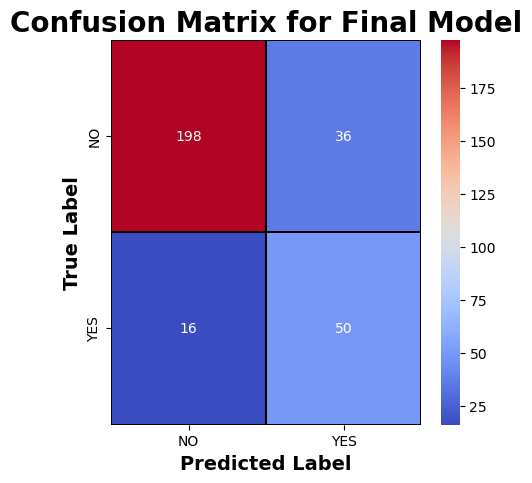

In [113]:
Matrix = confusion_matrix(Y_test, pred)

x_labels = ["NO","YES"]
y_labels = ["NO","YES"]

fig , ax = plt.subplots(figsize=(5,5))
sns.heatmap(Matrix, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, 
            cmap="coolwarm", xticklabels = x_labels, yticklabels = y_labels)

plt.xlabel("Predicted Label",fontsize=14,fontweight='bold')
plt.ylabel("True Label",fontsize=14,fontweight='bold')
plt.title('Confusion Matrix for Final Model',fontsize=20,fontweight='bold')
plt.show()

<span style="color:BLUE;font-size: 22px;font-family: verdana;font-weight: bold ">AUC:ROC CURVE</span>


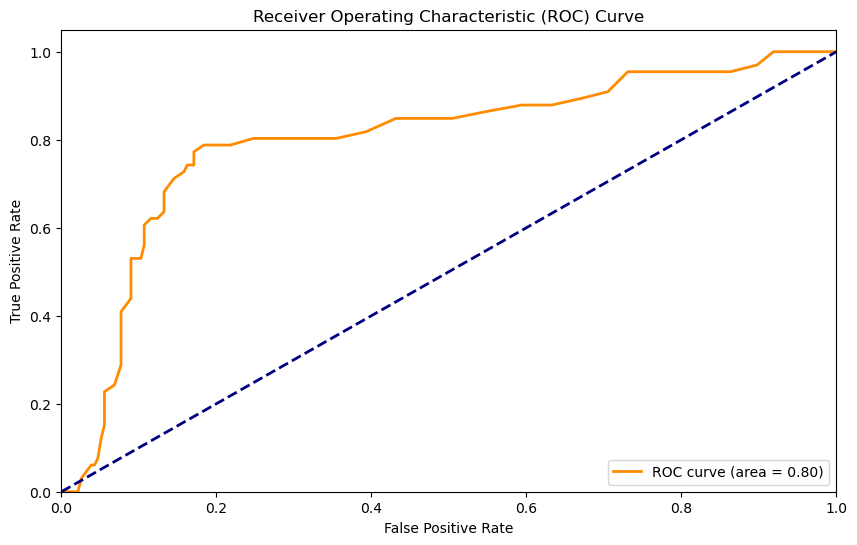

In [114]:
from sklearn.metrics import roc_curve, auc

# Assuming you have true labels (y_true) and predicted probabilities (y_probs) from your model
y_probs = rfc.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(Y_test, y_probs)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

<span style="color:magenta;font-size: 25px;font-family: verdana;font-weight: bold ">SAVING-FINAL MODEL</SPAN>

In [115]:
import joblib
joblib.dump(abc,'InsuranceClaimFraudDetection.pkl')

['InsuranceClaimFraudDetection.pkl']

<span style="color:magenta;font-size: 25px;font-family: verdana;font-weight: bold ">PREDICTION</SPAN>

In [116]:
prediction = rfc.predict(X_test)
Actual = np.array(Y_test)
df_Pred = pd.DataFrame()
df_Pred["Predicted Values"] = prediction
df_Pred["Actual Values"] = Actual
df_Pred.head(30)

,Predicted Values,Actual Values
0,1,0
1,0,0
2,0,0
3,0,0
4,0,0
5,0,0
6,0,0
7,0,0
8,0,0
9,0,0
